# The Sparks Foundation Internship

# Name:- Shivam Singhal
## Exploratory Data Analysis- Terrorism 

In [34]:
import pandas as pd   # importing modules
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [35]:
df = pd.read_csv("terror.csv", encoding = "ISO-8859-1")
df.head(10) # printing first five rows of dataset

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
5,197001010002,1970,1,1,NaN,0,NaN,217,United States,1,...,"The Cairo Chief of Police, William Petersen, r...","""Police Chief Quits,"" Washington Post, January...","""Cairo Police Chief Quits; Decries Local 'Mili...","Christopher Hewitt, ""Political Violence and Te...",Hewitt Project,-9,-9,0,-9,NaN
6,197001020001,1970,1,2,NaN,0,NaN,218,Uruguay,3,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
7,197001020002,1970,1,2,NaN,0,NaN,217,United States,1,...,"Damages were estimated to be between $20,000-$...",Committee on Government Operations United Stat...,"Christopher Hewitt, ""Political Violence and Te...",NaN,Hewitt Project,-9,-9,0,-9,NaN
8,197001020003,1970,1,2,NaN,0,NaN,217,United States,1,...,The New Years Gang issue a communiqué to a loc...,"Tom Bates, ""Rads: The 1970 Bombing of the Army...","David Newman, Sandra Sutherland, and Jon Stewa...","The Wisconsin Cartographers' Guild, ""Wisconsin...",Hewitt Project,0,0,0,0,NaN
9,197001030001,1970,1,3,NaN,0,NaN,217,United States,1,...,"Karl Armstrong's girlfriend, Lynn Schultz, dro...",Committee on Government Operations United Stat...,"Tom Bates, ""Rads: The 1970 Bombing of the Army...","David Newman, Sandra Sutherland, and Jon Stewa...",Hewitt Project,0,0,0,0,NaN


In [36]:
df.tail() # printing last five rows of dataset

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
181686,201712310022,2017,12,31,NaN,0,NaN,182,Somalia,11,...,NaN,"""Somalia: Al-Shabaab Militants Attack Army Che...","""Highlights: Somalia Daily Media Highlights 2 ...","""Highlights: Somalia Daily Media Highlights 1 ...",START Primary Collection,0,0,0,0,NaN
181687,201712310029,2017,12,31,NaN,0,NaN,200,Syria,10,...,NaN,"""Putin's 'victory' in Syria has turned into a ...","""Two Russian soldiers killed at Hmeymim base i...","""Two Russian servicemen killed in Syria mortar...",START Primary Collection,-9,-9,1,1,NaN
181688,201712310030,2017,12,31,NaN,0,NaN,160,Philippines,5,...,NaN,"""Maguindanao clashes trap tribe members,"" Phil...",NaN,NaN,START Primary Collection,0,0,0,0,NaN
181689,201712310031,2017,12,31,NaN,0,NaN,92,India,6,...,NaN,"""Trader escapes grenade attack in Imphal,"" Bus...",NaN,NaN,START Primary Collection,-9,-9,0,-9,NaN
181690,201712310032,2017,12,31,NaN,0,NaN,160,Philippines,5,...,NaN,"""Security tightened in Cotabato following IED ...","""Security tightened in Cotabato City,"" Manila ...",NaN,START Primary Collection,-9,-9,0,-9,NaN


In [37]:
df.shape # determing shape of the dataset

(181691, 135)

In [38]:
df.info() # gathering information from the dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Columns: 135 entries, eventid to related
dtypes: float64(55), int64(22), object(58)
memory usage: 187.1+ MB


In [39]:
df.drop(columns=['eventid'], inplace=True) # dropping it as not needed

In [40]:
df.describe()

,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,vicinity,...,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
count,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,181685.000000,181691.000000,...,1.350000e+03,5.630000e+02,7.740000e+02,552.000000,10991.000000,10400.000000,181691.000000,181691.000000,181691.000000,181691.000000
mean,2002.638997,6.467277,15.505644,0.045346,131.968501,7.160938,23.498343,-4.586957e+02,1.451452,0.068297,...,3.172530e+06,5.784865e+05,7.179437e+05,240.378623,4.629242,-29.018269,-4.543731,-4.464398,0.090010,-3.945952
std,13.259430,3.388303,8.814045,0.208063,112.414535,2.933408,18.569242,2.047790e+05,0.995430,0.284553,...,3.021157e+07,7.077924e+06,1.014392e+07,2940.967293,2.035360,65.720119,4.543547,4.637152,0.568457,4.691325
min,1970.000000,0.000000,0.000000,0.000000,4.000000,1.000000,-53.154613,-8.618590e+07,1.000000,-9.000000,...,-9.900000e+01,-9.900000e+01,-9.900000e+01,-99.000000,1.000000,-99.000000,-9.000000,-9.000000,-9.000000,-9.000000
25%,1991.000000,4.000000,8.000000,0.000000,78.000000,5.000000,11.510046,4.545640e+00,1.000000,0.000000,...,0.000000e+00,0.000000e+00,-9.900000e+01,0.000000,2.000000,-99.000000,-9.000000,-9.000000,0.000000,-9.000000
50%,2009.000000,6.000000,15.000000,0.000000,98.000000,6.000000,31.467463,4.324651e+01,1.000000,0.000000,...,1.500000e+04,0.000000e+00,0.000000e+00,0.000000,4.000000,0.000000,-9.000000,-9.000000,0.000000,0.000000
75%,2014.000000,9.000000,23.000000,0.000000,160.000000,10.000000,34.685087,6.871033e+01,1.000000,0.000000,...,4.000000e+05,0.000000e+00,1.273412e+03,0.000000,7.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,2017.000000,12.000000,31.000000,1.000000,1004.000000,12.000000,74.633553,1.793667e+02,5.000000,1.000000,...,1.000000e+09,1.320000e+08,2.750000e+08,48000.000000,7.000000,2769.000000,1.000000,1.000000,1.000000,1.000000


In [49]:
df.columns.values

array(['iyear', 'imonth', 'iday', 'approxdate', 'extended', 'resolution',
       'country', 'country_txt', 'region', 'region_txt', 'provstate',
       'city', 'latitude', 'longitude', 'specificity', 'vicinity',
       'location', 'summary', 'crit1', 'crit2', 'crit3', 'doubtterr',
       'alternative', 'alternative_txt', 'multiple', 'success', 'suicide',
       'attacktype1', 'attacktype1_txt', 'attacktype2', 'attacktype2_txt',
       'attacktype3', 'attacktype3_txt', 'targtype1', 'targtype1_txt',
       'targsubtype1', 'targsubtype1_txt', 'corp1', 'target1', 'natlty1',
       'natlty1_txt', 'targtype2', 'targtype2_txt', 'targsubtype2',
       'targsubtype2_txt', 'corp2', 'target2', 'natlty2', 'natlty2_txt',
       'targtype3', 'targtype3_txt', 'targsubtype3', 'targsubtype3_txt',
       'corp3', 'target3', 'natlty3', 'natlty3_txt', 'gname', 'gsubname',
       'gname2', 'gsubname2', 'gname3', 'gsubname3', 'motive',
       'guncertain1', 'guncertain2', 'guncertain3', 'individual',
       

In [42]:
df.nunique()

iyear            47
imonth           13
iday             32
approxdate     2244
extended          2
              ...  
INT_LOG           3
INT_IDEO          3
INT_MISC          3
INT_ANY           3
related       14306
Length: 134, dtype: int64

In [44]:
df.isnull().sum() # checking for null value if any

iyear              0
imonth             0
iday               0
approxdate    172452
extended           0
               ...  
INT_LOG            0
INT_IDEO           0
INT_MISC           0
INT_ANY            0
related       156653
Length: 134, dtype: int64

## Performing Relationship Analysis

In [45]:
correlation = df.corr() # correlation among various parameter

In [46]:
correlation

,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,vicinity,...,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
iyear,1.000000,0.000139,0.018254,0.091754,-0.135023,0.401384,0.166933,0.003917,0.030626,0.070659,...,-0.009984,-0.018216,-0.014238,-0.165375,0.256092,-0.181556,-0.143601,-0.133253,-0.077847,-0.175596
imonth,0.000139,1.000000,0.005497,-0.000468,-0.006305,-0.002999,-0.015978,-0.003880,0.003621,-0.004501,...,-0.000710,0.046989,0.058878,-0.016597,0.011295,-0.011535,-0.002302,-0.002034,-0.002554,-0.006336
iday,0.018254,0.005497,1.000000,-0.004700,0.003468,0.009710,0.003423,-0.002285,-0.006991,-0.005367,...,0.012755,-0.010502,0.003148,-0.006581,-0.006706,0.001765,-0.001540,-0.001621,-0.002027,-0.001199
extended,0.091754,-0.000468,-0.004700,1.000000,-0.020466,0.038389,-0.024749,0.000523,0.057897,0.017784,...,-0.008114,0.028177,0.001966,0.009367,0.233293,-0.192155,0.071768,0.075147,0.027335,0.080767
country,-0.135023,-0.006305,0.003468,-0.020466,1.000000,0.148597,0.178567,-0.000269,-0.084599,-0.012291,...,0.006337,0.029833,-0.025997,-0.037097,0.012434,-0.044331,0.069904,0.067564,0.207281,0.153118
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
nreleased,-0.181556,-0.011535,0.001765,-0.192155,-0.044331,-0.149511,0.002790,-0.017745,-0.030631,-0.014487,...,0.054571,0.034843,0.049322,0.016832,-0.555478,1.000000,0.039388,0.040947,0.085055,0.064759
INT_LOG,-0.143601,-0.002302,-0.001540,0.071768,0.069904,-0.082584,-0.099827,0.002272,0.073022,0.014487,...,0.035821,0.031079,0.007029,-0.045504,-0.015442,0.039388,1.000000,0.996211,0.052537,0.891051
INT_IDEO,-0.133253,-0.002034,-0.001621,0.075147,0.067564,-0.071917,-0.094470,0.002268,0.071333,0.015119,...,0.039053,0.041983,0.013162,-0.039844,-0.016234,0.040947,0.996211,1.000000,0.082014,0.893811
INT_MISC,-0.077847,-0.002554,-0.002027,0.027335,0.207281,0.043139,0.097652,0.000371,-0.019197,-0.008232,...,0.023815,0.125162,0.037227,0.129274,-0.119776,0.085055,0.052537,0.082014,1.000000,0.252193


In [51]:
df1 = df[['iyear', 'imonth','country_txt','region_txt', 'provstate','city','nkill','nwound', 'attacktype1_txt', 'weaptype1_txt','targtype1_txt' ,'gname', 'success' ]]
# taking only the columns that are useful for analysis

In [52]:
df1.head()

,iyear,imonth,country_txt,region_txt,provstate,city,nkill,nwound,attacktype1_txt,weaptype1_txt,targtype1_txt,gname,success
0,1970,7,Dominican Republic,Central America & Caribbean,NaN,Santo Domingo,1.0,0.0,Assassination,Unknown,Private Citizens & Property,MANO-D,1
1,1970,0,Mexico,North America,Federal,Mexico city,0.0,0.0,Hostage Taking (Kidnapping),Unknown,Government (Diplomatic),23rd of September Communist League,1
2,1970,1,Philippines,Southeast Asia,Tarlac,Unknown,1.0,0.0,Assassination,Unknown,Journalists & Media,Unknown,1
3,1970,1,Greece,Western Europe,Attica,Athens,NaN,NaN,Bombing/Explosion,Explosives,Government (Diplomatic),Unknown,1
4,1970,1,Japan,East Asia,Fukouka,Fukouka,NaN,NaN,Facility/Infrastructure Attack,Incendiary,Government (Diplomatic),Unknown,1


In [53]:
df1.shape # finding the shape of the new data

(181691, 13)

<AxesSubplot:>

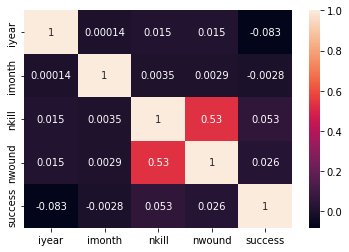

In [54]:
sns.heatmap(df1.corr(), annot=True)

In [79]:
df1['country_txt'].value_counts().idxmax() # highest count for a country

'Iraq'

<AxesSubplot:>

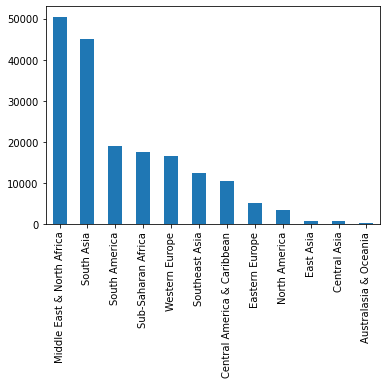

In [80]:
df1['region_txt'].value_counts().plot.bar() # highest count for a region

<AxesSubplot:>

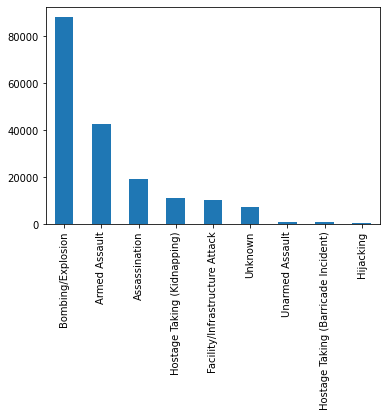

In [81]:
df1['attacktype1_txt'].value_counts().plot.bar() # type of attack which is mostly used

<AxesSubplot:>

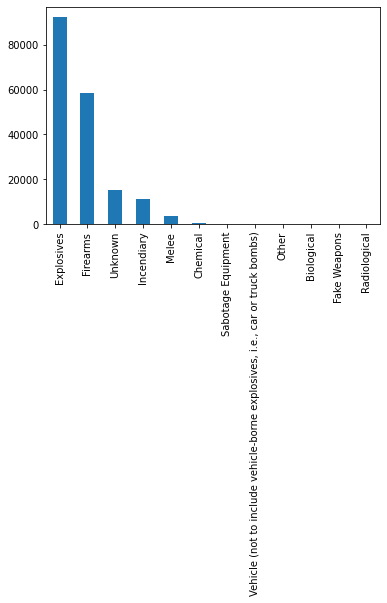

In [82]:
df1['weaptype1_txt'].value_counts().plot.bar() # weapon type mostly used

<AxesSubplot:>

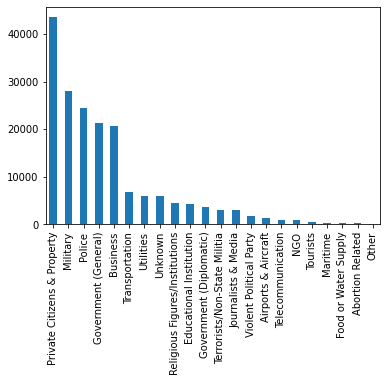

In [83]:
df1['targtype1_txt'].value_counts().plot.bar() # who all are targeted for the attack

<AxesSubplot:>

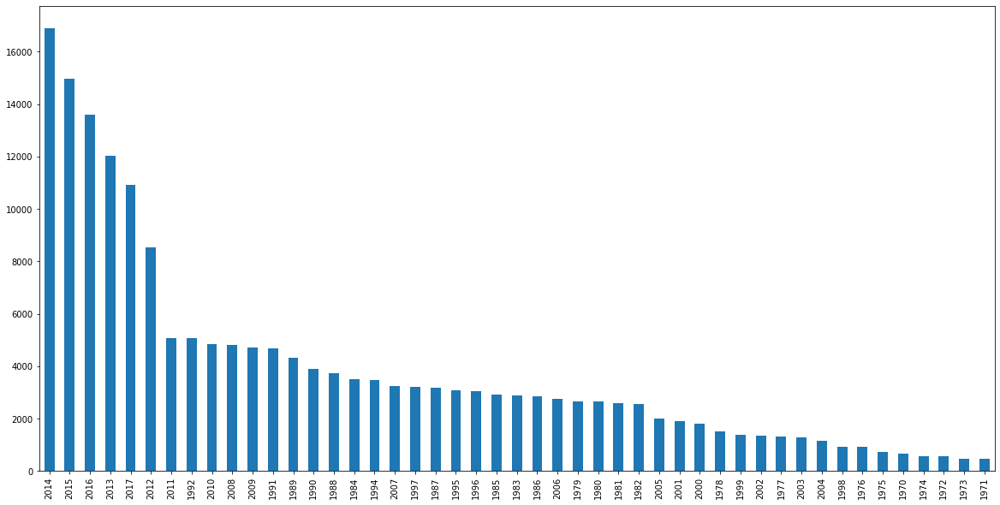

In [86]:
df1['iyear'].value_counts().plot.bar(figsize=(20,10)) # visualising the year with the max no of attacks

<AxesSubplot:>

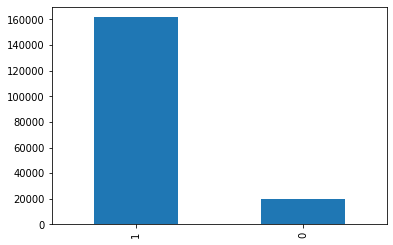

In [91]:
df1['success'].value_counts().plot.bar() # majority of attempts were success

<AxesSubplot:xlabel='iyear'>

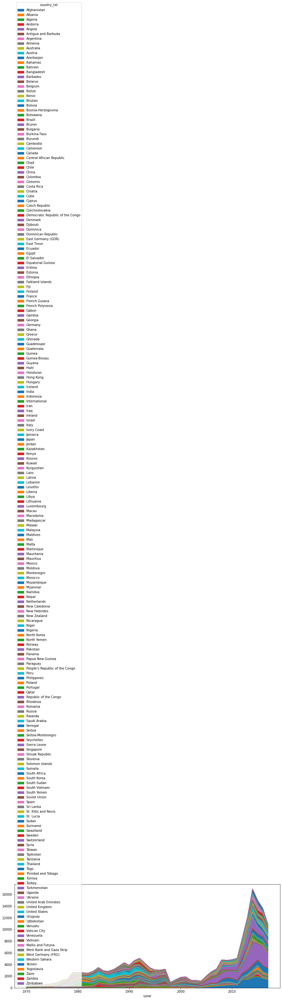

In [106]:
pd.crosstab(df1['iyear'],df1['country_txt']).plot(kind="area",figsize=(15,6)) # visualising terror across countries

<AxesSubplot:xlabel='region_txt'>

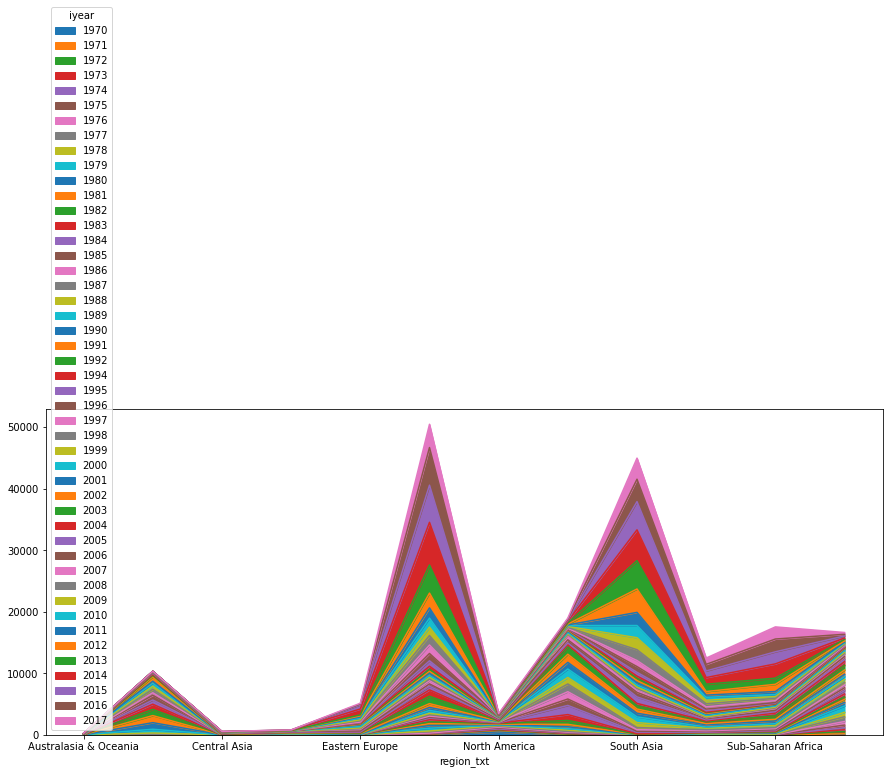

In [104]:
pd.crosstab(df1['region_txt'],df1['iyear']).plot(kind="area",figsize=(15,6)) # visualising terror across region

<AxesSubplot:xlabel='iyear'>

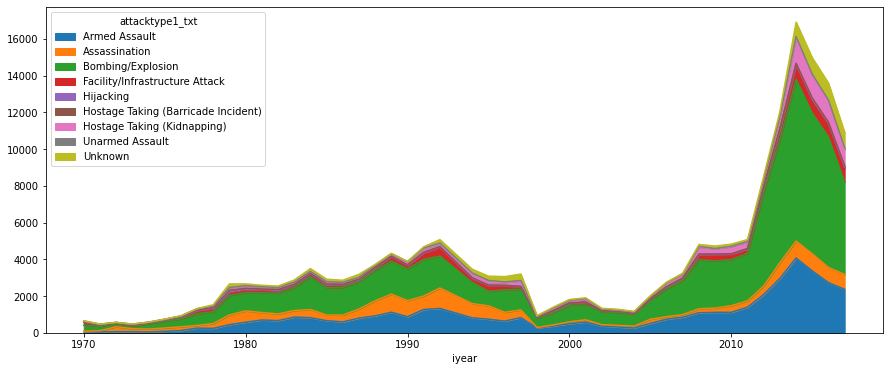

In [109]:
pd.crosstab(df1['iyear'],df1['attacktype1_txt']).plot(kind="area",figsize=(15,6))
# visualising attack type in course of year

<AxesSubplot:xlabel='iyear'>

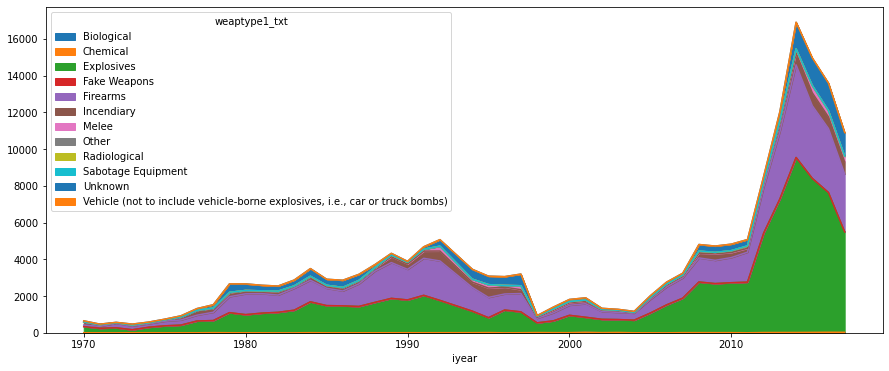

In [112]:
pd.crosstab(df1['iyear'],df1['weaptype1_txt']).plot(kind="area",figsize=(15,6))
# visualising weapon type in course of year

<AxesSubplot:xlabel='iyear'>

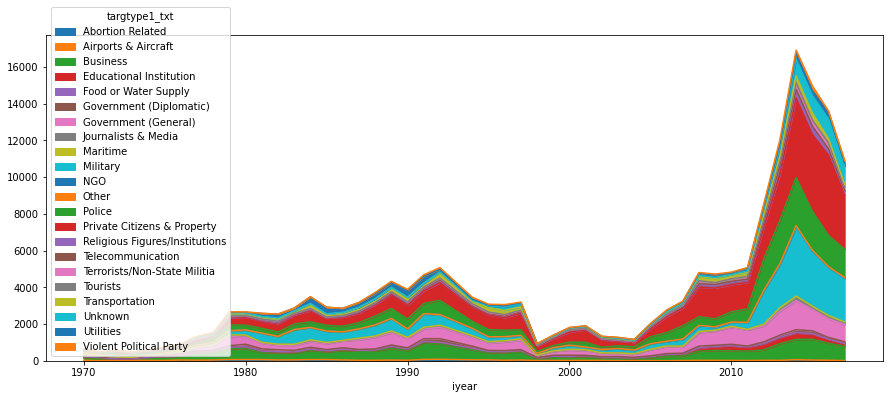

In [113]:
pd.crosstab(df1['iyear'],df1['targtype1_txt']).plot(kind="area",figsize=(15,6))
# visualising target type in course of year

In [115]:
df1['gname'].value_counts()

Unknown                                             82782
Taliban                                              7478
Islamic State of Iraq and the Levant (ISIL)          5613
Shining Path (SL)                                    4555
Farabundo Marti National Liberation Front (FMLN)     3351
                                                    ...  
Ansar Sarallah                                          1
Sword of Islam                                          1
Support of Ocalan-The Hawks of Thrace                   1
Arab Revolutionary Front                                1
MANO-D                                                  1
Name: gname, Length: 3537, dtype: int64

<AxesSubplot:xlabel='iyear'>

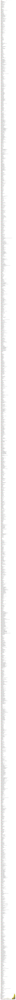

In [114]:
pd.crosstab(df1['iyear'],df1['gname']).plot(kind="area",figsize=(15,6)) # visualising the terror groups

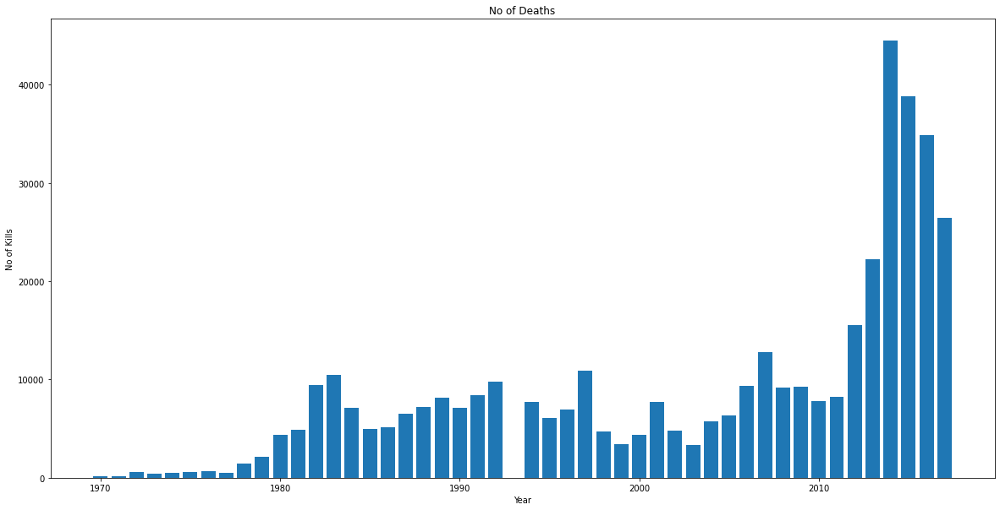

In [131]:
x1 = df1['iyear'].unique()
x2 = df1.groupby('iyear')['nkill'].sum()
plt.figure(figsize=(20,10))
plt.bar(x1,x2)
plt.xlabel("Year")
plt.ylabel("No of Kills")
plt.title("No of Deaths")
plt.show()
# number of death 

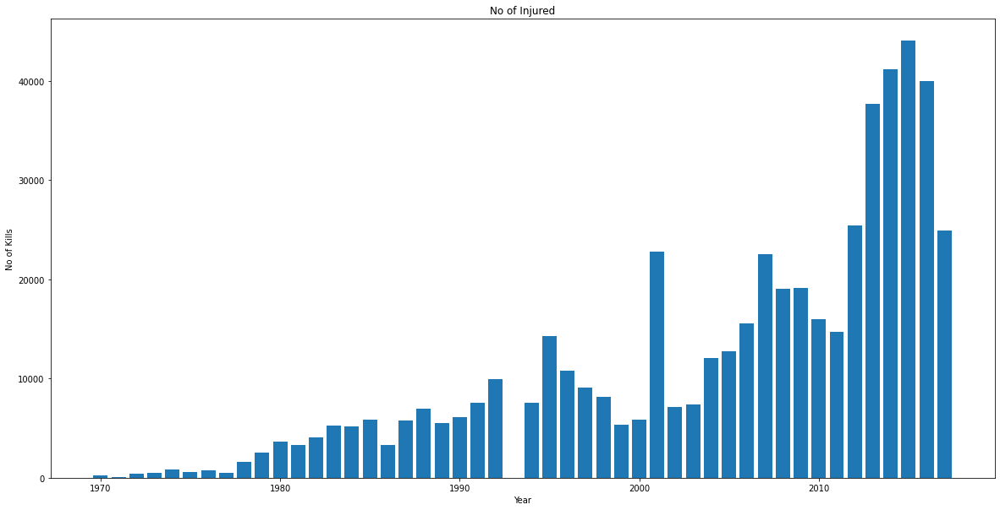

In [132]:
x1 = df1['iyear'].unique()
x2 = df1.groupby('iyear')['nwound'].sum()
plt.figure(figsize=(20,10))
plt.bar(x1,x2)
plt.xlabel("Year")
plt.ylabel("No of Kills")
plt.title("No of Injured")
plt.show()
# number of wounds

# Conclusion

## Iraq is the hottest zone among various countries facing terrorism
## Region wise Middle East and North Africa is highest
## Bombing/Explosives are modes which are used most
## Private Citizens and Property are main target for the attacks
## Success rate for the attack is very high and year 2014 is the year which most terror attacks
## Taliban is the currently active group
## After 2010 no of deaths and injuries increases rapidly